In [1]:
import os
import yaml

# Define data paths
DATA_PATH = '/kaggle/input/football-dataset/dataset/'
TRAIN_SET_PATH = DATA_PATH + 'train/'
VAL_SET_PATH = DATA_PATH + 'val/'
TEST_SET_PATH = DATA_PATH + 'test/'

In [2]:
!pip -q install ultralytics
!pip -q install -U albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.9/273.9 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 28.4 MB/s eta 0:00:00


In [3]:
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  labels = data['names']

print("Labels are:")
for i, label in enumerate(labels):
  print(str(i) + ' - ' + label)

Labels are:
0 - Player team left
1 - Player team right
2 - Goalkeeper team left
3 - Goalkeeper team right
4 - Ball
5 - Main referee
6 - Side referee
7 - Staff members


In [4]:
train_images_count =  len(os.listdir(TRAIN_SET_PATH + 'images/'))
validation_images_count = len(os.listdir(VAL_SET_PATH + 'images/'))
test_images_count = len(os.listdir(TEST_SET_PATH + 'images/'))

print("Train set images count: ", train_images_count)
print("Validation set images count: ", validation_images_count)
print("Test set images count: ", test_images_count)

Train set images count:  10212
Validation set images count:  1276
Test set images count:  1276


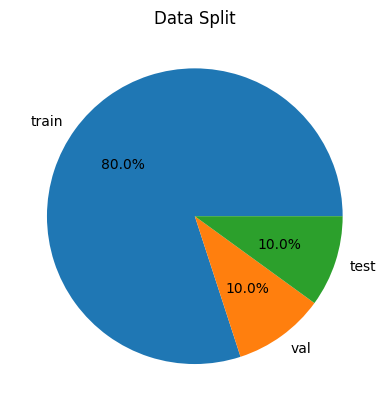

In [5]:

import matplotlib.pyplot as plt
import numpy as np

data = np.array([train_images_count, validation_images_count, test_images_count])
plt.pie(data,
        labels=['train', 'val', 'test'],
        autopct='%1.1f%%')
plt.title('Data Split')
plt.show();

9881.png


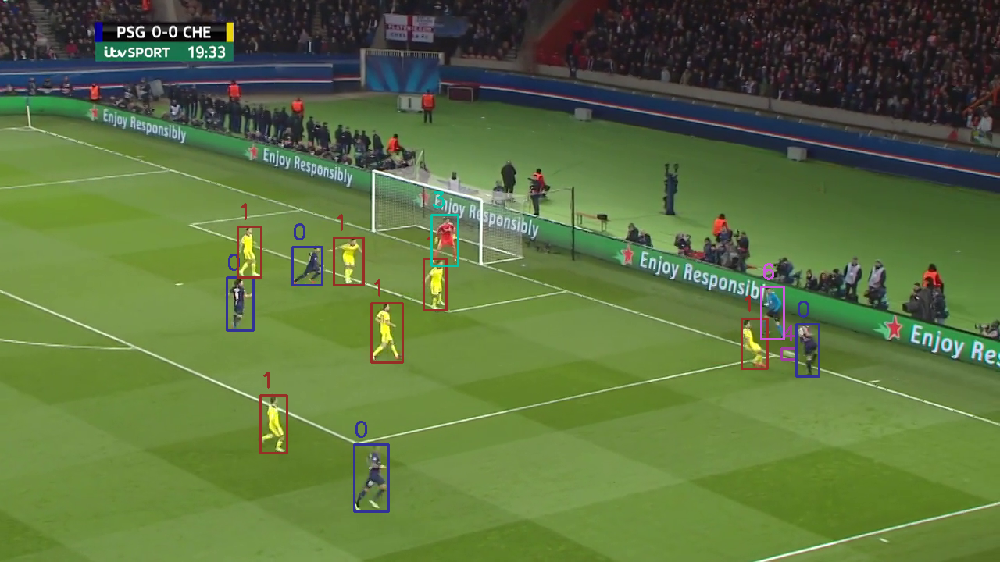

8811.png


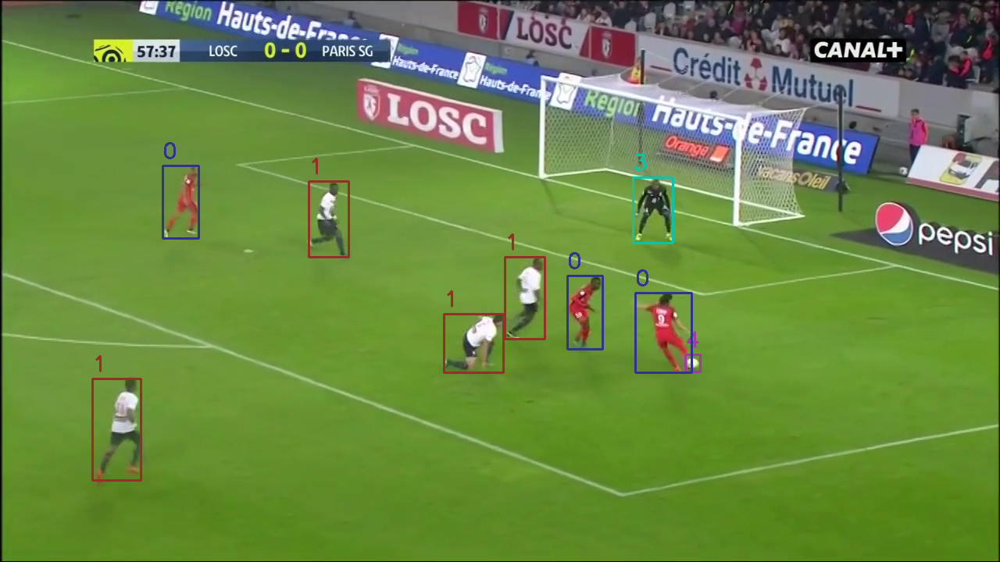

6250.png


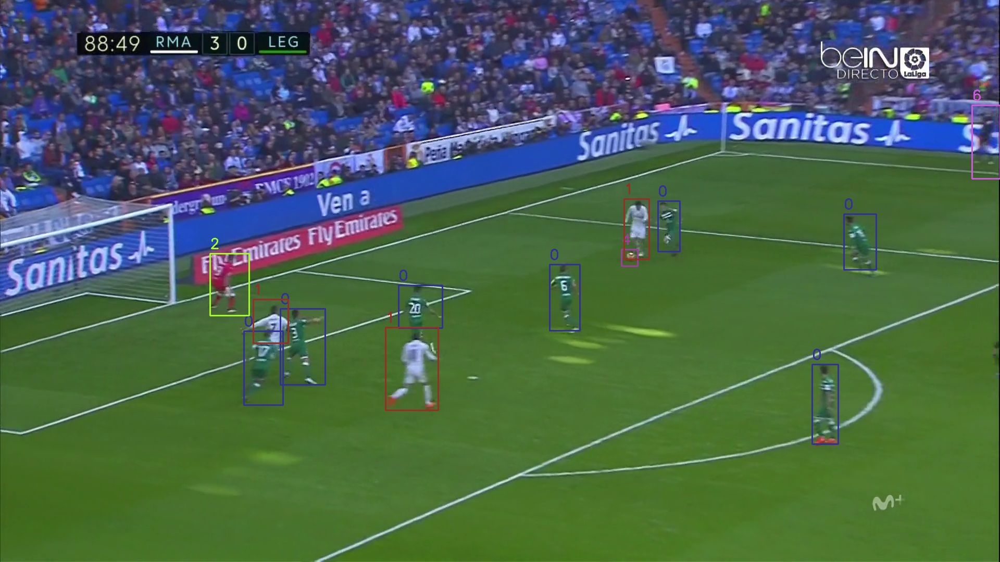

3561.png


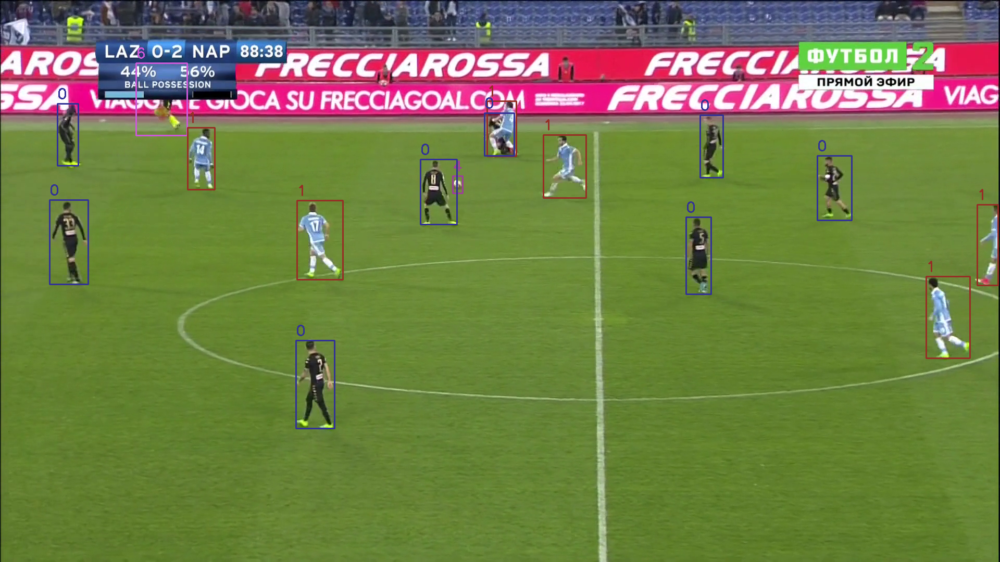

698.png


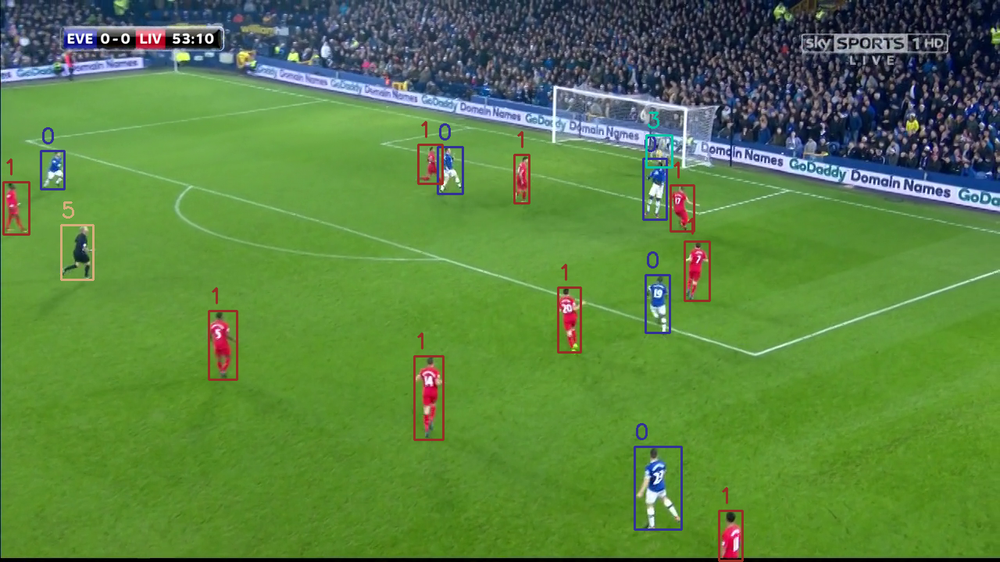

In [6]:
import random
random.seed(15)
import cv2
from google.colab.patches import cv2_imshow

box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}

train_images_names = os.listdir(TRAIN_SET_PATH + 'images/')
random_images = random.sample(train_images_names, k=5)

for img_name in random_images:
  print(img_name)
  img = cv2.imread(TRAIN_SET_PATH + 'images/' + img_name)

  with open(TRAIN_SET_PATH + 'labels/' + img_name.split('.')[0] + '.txt') as f:
    bounding_boxes = f.readlines()

  for box in bounding_boxes:
    box = box.strip().split()
    label, x, y, w, h = int(box[0]), float(box[1]), float(box[2]), float(box[3]), float(box[4])

    # Convert YOLO format to OpenCV format
    x1 = int((x - w / 2) * img.shape[1])
    y1 = int((y - h / 2) * img.shape[0])
    x2 = int((x + w / 2) * img.shape[1])
    y2 = int((y + h / 2) * img.shape[0])

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[str(label)], 2)
    cv2.putText(img, str(label), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

  cv2_imshow(img);

In [7]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt

labels_dir = TRAIN_SET_PATH + 'labels/'
label_freq = [0] * len(labels)
scales = []
aspect_ratios = []
label_scale = [0] * len(labels)

for labels_file in tqdm(os.listdir(labels_dir)):
    # Load the bounding box information from the current file
    with open(os.path.join(labels_dir, labels_file), 'r') as f:
        bounding_boxes = f.readlines()

    # Update the information
    for box in bounding_boxes:
        box = box.strip().split()
        label, w, h = int(box[0]), float(box[3]), float(box[4])

        scale = w * h
        aspect_ratio = w/h

        label_freq[label] += 1
        scales.append(scale)
        label_scale[label] += scale
        aspect_ratios.append(aspect_ratio)

# Print the label frequencies
print()
print('#' * 100)
for label, freq in enumerate(label_freq):
    print(f'{labels[label]}: {freq}')

100%|██████████| 10212/10212 [01:18<00:00, 129.36it/s]


####################################################################################################
Player team left: 60852
Player team right: 60915
Goalkeeper team left: 3729
Goalkeeper team right: 3449
Ball: 7798
Main referee: 7146
Side referee: 5361
Staff members: 2211


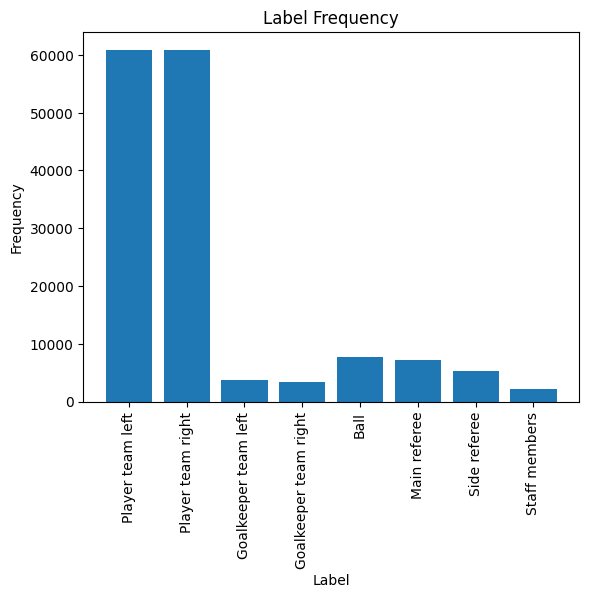

In [8]:
plt.bar(labels, label_freq)
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Label Frequency")
plt.show()

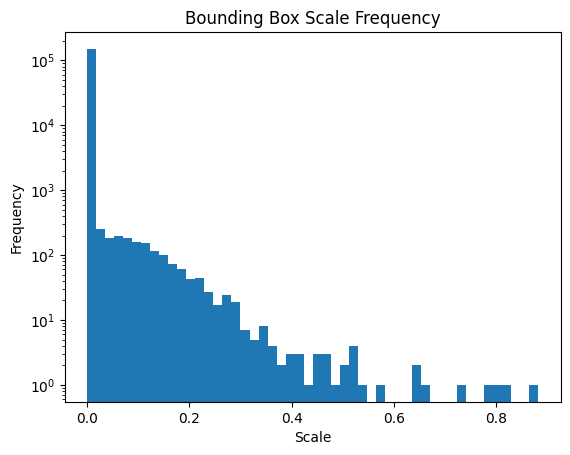

In [9]:
plt.hist(scales, bins=50)
plt.xlabel('Scale')
plt.ylabel('Frequency')
plt.yscale('log')
plt.title("Bounding Box Scale Frequency")
plt.show()

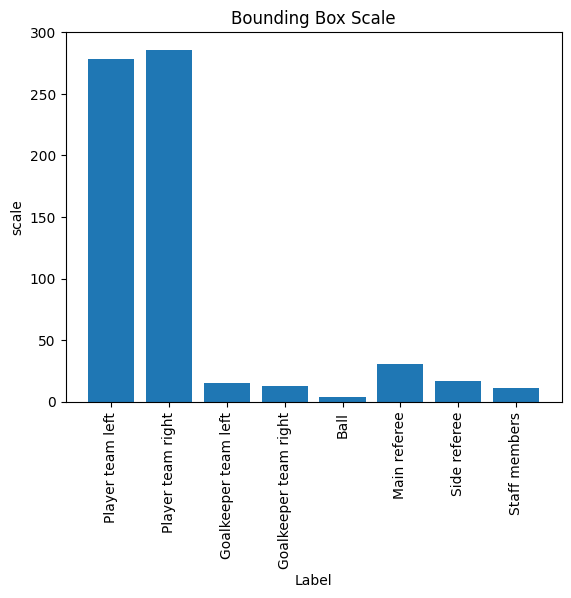

In [10]:
plt.bar(labels, label_scale)
plt.xlabel('Label')
plt.ylabel('scale')
plt.xticks(rotation=90)
plt.title("Bounding Box Scale")
plt.show()

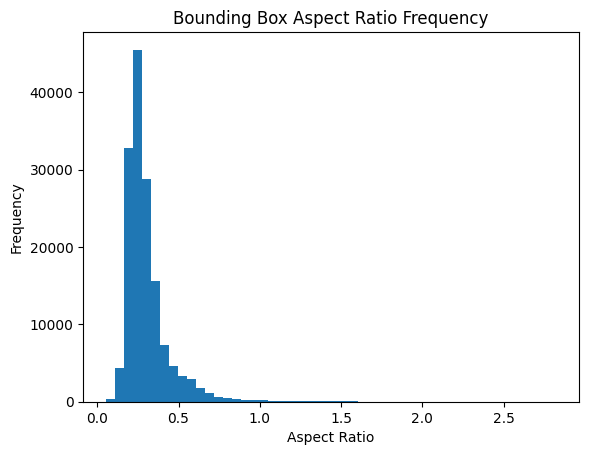

In [11]:
plt.hist(aspect_ratios, bins=50)
plt.xlabel('Aspect Ratio')
plt.ylabel('Frequency')
plt.title("Bounding Box Aspect Ratio Frequency")
plt.show()

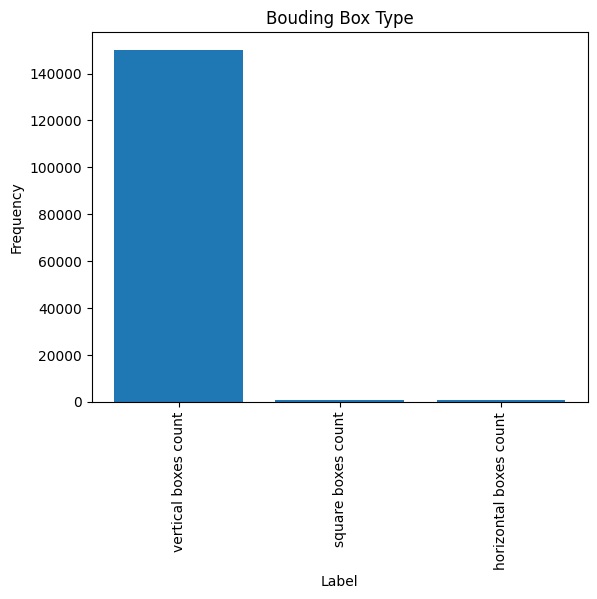

In [12]:
vertical_boxes_count = np.sum([ratio < 0.9 for ratio in aspect_ratios])
square_boxes_count = np.sum([ratio > 0.9 and ratio < 1.1 for ratio in aspect_ratios])
horizontal_boxes_count = np.sum([ratio > 1.1 for ratio in aspect_ratios])

plt.bar(['vertical boxes count', 'square boxes count', 'horizontal boxes count'],
        [vertical_boxes_count, square_boxes_count, horizontal_boxes_count])
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Bouding Box Type")
plt.show()

In [13]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt
import os

images_dir = TRAIN_SET_PATH + 'images/'
resolutions = Counter()

for image_name in tqdm(os.listdir(images_dir)):
    image = plt.imread(images_dir + image_name)
    h, w = image.shape[: 2]
    resolutions[(w, h)] += 1

# Print the label frequencies
print()
print('#' * 100)
for resolution, freq in resolutions.items():
    print(f'{resolution}: {freq}')

100%|██████████| 10212/10212 [10:11<00:00, 16.69it/s]


####################################################################################################
(1280, 720): 6877
(1920, 1080): 3237
(704, 576): 16
(1366, 768): 31
(854, 480): 51


Loading a label file to check its contents

In [14]:
with open('/kaggle/input/football-dataset/dataset/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)

4 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
1 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
1 0.9217604166666666 0.5098611111111111 0

In [15]:
import os
from tqdm import tqdm
import shutil


labels_mapping = {
    '0': '0',
    '1': '0',
    '2': '1',
    '3': '1',
    '4': '2',
    '5': '3',
    '6': '4',
    '7': '5'
}

for dataset_path in [TRAIN_SET_PATH, VAL_SET_PATH]:
    print(f'Working on {dataset_path}')
    labels_path = dataset_path + 'labels/'

    # Tạo thư mục writable để sao chép dữ liệu
    writable_labels_path = labels_path.replace('/kaggle/input', '/kaggle/working')
    os.makedirs(writable_labels_path, exist_ok=True)

    # Sao chép tất cả các tệp từ thư mục gốc sang thư mục writable
    for label_file_name in os.listdir(labels_path):
        src_file = os.path.join(labels_path, label_file_name)
        dest_file = os.path.join(writable_labels_path, label_file_name)
        shutil.copy(src_file, dest_file)

    # Chỉnh sửa các tệp trong thư mục writable
    for label_file_name in tqdm(os.listdir(writable_labels_path)):
        label_file_path = os.path.join(writable_labels_path, label_file_name)

        # Đọc nội dung tệp
        with open(label_file_path, 'r') as f:
            lines = f.readlines()

        # Ghi đè nội dung với các thay đổi
        with open(label_file_path, 'w') as f:
            for line in lines:
                label = line.split()[0]
                line = line.replace(label, labels_mapping[label], 1)
                f.write(line)

    print(f'Finished processing {dataset_path}')


Working on /kaggle/input/football-dataset/dataset/train/


100%|██████████| 10212/10212 [00:01<00:00, 9865.82it/s]


Finished processing /kaggle/input/football-dataset/dataset/train/
Working on /kaggle/input/football-dataset/dataset/val/


100%|██████████| 1276/1276 [00:00<00:00, 10538.66it/s]

Finished processing /kaggle/input/football-dataset/dataset/val/


Checking the same file content after the updating step

In [16]:
with open('/kaggle/working/football-dataset/dataset/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)

2 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
0 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
0 0.9217604166666666 0.5098611111111111 0

In [17]:
import os
from tqdm import tqdm
import shutil
from PIL import Image  # Nếu cần xử lý ảnh

# Cấu hình đường dẫn
TRAIN_IMAGE_PATH = '/kaggle/input/football-dataset/dataset/train/images/'
VAL_IMAGE_PATH = '/kaggle/input/football-dataset/dataset/val/images/'

# Danh sách các tập cần xử lý
dataset_paths = [TRAIN_IMAGE_PATH, VAL_IMAGE_PATH]

for dataset_path in dataset_paths:
    print(f'Processing images in {dataset_path}')
    
    # Tạo thư mục writable
    writable_image_path = dataset_path.replace('/kaggle/input', '/kaggle/working')
    os.makedirs(writable_image_path, exist_ok=True)

    # Sao chép ảnh sang thư mục writable
    for image_file_name in tqdm(os.listdir(dataset_path)):
        src_file = os.path.join(dataset_path, image_file_name)
        dest_file = os.path.join(writable_image_path, image_file_name)
        shutil.copy(src_file, dest_file)

    # Thực hiện xử lý ảnh (ví dụ: resize)
    for image_file_name in tqdm(os.listdir(writable_image_path)):
        image_file_path = os.path.join(writable_image_path, image_file_name)

        # Mở và xử lý ảnh
        with Image.open(image_file_path) as img:
            # Ví dụ: Resize ảnh
            img_resized = img.resize((256, 256))  # Resize ảnh thành 256x256
            
            # Lưu ảnh đã xử lý (ghi đè lên tệp cũ)
            img_resized.save(image_file_path)

    print(f'Finished processing images in {dataset_path}')


Processing images in /kaggle/input/football-dataset/dataset/train/images/


100%|██████████| 10212/10212 [11:04<00:00, 15.36it/s]


Finished processing images in /kaggle/input/football-dataset/dataset/train/images/
Processing images in /kaggle/input/football-dataset/dataset/val/images/


100%|██████████| 1276/1276 [01:22<00:00, 15.53it/s]

Finished processing images in /kaggle/input/football-dataset/dataset/val/images/


Loading the data.yaml file to check its content

In [18]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player team left', 'Player team right', 'Goalkeeper team left', 'Goalkeeper team right', 'Ball', 'Main referee', 'Side referee', 'Staff members'], 'nc': 8, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [19]:
import yaml
import shutil
import os

# Đường dẫn tới tệp data.yaml gốc và nơi sẽ lưu bản sao writable
DATA_PATH = '/kaggle/input/football-dataset/dataset/'  # Thư mục chỉ đọc
WORKING_PATH = '/kaggle/working/football-dataset/dataset/'  # Thư mục writable

# Tạo thư mục writable nếu chưa tồn tại
os.makedirs(WORKING_PATH, exist_ok=True)

# Sao chép tệp data.yaml từ thư mục chỉ đọc sang writable
shutil.copy(DATA_PATH + 'data.yaml', WORKING_PATH + 'data.yaml')

# Đường dẫn tới tệp writable
yaml_path = WORKING_PATH + 'data.yaml'

# Danh sách nhãn mới
new_labels = ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member']

# Đọc tệp YAML, chỉnh sửa và ghi đè
with open(yaml_path, 'r') as f:
    data = yaml.safe_load(f)

# Cập nhật số lượng lớp và nhãn
data['nc'] = len(new_labels)
data['names'] = new_labels

# Ghi đè lại tệp YAML đã chỉnh sửa
with open(yaml_path, 'w') as f:
    yaml.safe_dump(data, f)

print(f"Đã chỉnh sửa và lưu tệp YAML tại: {yaml_path}")


Đã chỉnh sửa và lưu tệp YAML tại: /kaggle/working/football-dataset/dataset/data.yaml


Checking the data.yaml file content after the updating step

In [20]:
import yaml
with open('/kaggle/working/football-dataset/dataset/data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member'], 'nc': 6, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [21]:
import os

# Đường dẫn tới thư mục output
OUTPUT_DIR = '/kaggle/working/output/football_detection_results'

# Tạo thư mục nếu chưa tồn tại
os.makedirs(OUTPUT_DIR, exist_ok=True)

# In ra thông báo
print(f"Thư mục để lưu kết quả đã được tạo: {OUTPUT_DIR}")

Thư mục để lưu kết quả đã được tạo: /kaggle/working/output/football_detection_results


In [22]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8m.yaml').load('yolov8m.pt')  # build from YAML and transfer weights

# Train the model
results = model.train(data='/kaggle/working/football-dataset/dataset/data.yaml', lr0=0.03, epochs=10, imgsz=736, batch=16, resume=True, project='/kaggle/working/output/football_detection_results')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 49.7M/49.7M [00:00<00:00, 208MB/s]


Transferred 475/475 items from pretrained weights
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/kaggle/working/football-dataset/dataset/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=736, save=True, save_period=-1, cache=False, device=None, workers=8, project=/kaggle/working/output/football_detection_results, name=train, exist_ok=False, pretrained=yolov8m.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None,

100%|██████████| 755k/755k [00:00<00:00, 18.0MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.8MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/football-dataset/dataset/train/labels... 10212 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10212/10212 [00:10<00:00, 1009.24it/s]


train: New cache created: /kaggle/working/football-dataset/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/ultralytics/data/augment.py:1853: UserWarning: Argument 'quality_lower' is not valid and will be ignored.
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /kaggle/working/football-dataset/dataset/val/labels... 1276 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1276/1276 [00:01<00:00, 850.00it/s]

val: New cache created: /kaggle/working/football-dataset/dataset/val/labels.cache


Plotting labels to /kaggle/working/output/football_detection_results/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.03' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 736 train, 736 val
Using 2 dataloader workers
Logging results to /kaggle/working/output/football_detection_results/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/ultralytics/data/augment.py:1853: UserWarning: Argument 'quality_lower' is not valid and will be ignored.
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      8.96G      1.029     0.7567      1.021         65        736: 100%|██████████| 639/639 [08:14<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:25<00:00,  1.58it/s]

                   all       1276      18895      0.777      0.728      0.777      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         9G      1.008     0.5825      1.023         57        736: 100%|██████████| 639/639 [08:15<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:23<00:00,  1.69it/s]

                   all       1276      18895      0.783      0.753      0.786      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      8.82G     0.9934     0.5549      1.021         54        736: 100%|██████████| 639/639 [08:08<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:24<00:00,  1.66it/s]

                   all       1276      18895       0.79      0.766      0.801      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.87G     0.9718     0.5216      1.019         67        736: 100%|██████████| 639/639 [08:09<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:22<00:00,  1.74it/s]

                   all       1276      18895      0.825      0.766      0.803      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      8.95G      0.955     0.5003      1.014         43        736: 100%|██████████| 639/639 [07:43<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:22<00:00,  1.77it/s]

                   all       1276      18895      0.841      0.772      0.822       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      8.91G     0.9356     0.4793      1.008         65        736: 100%|██████████| 639/639 [07:52<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:23<00:00,  1.67it/s]

                   all       1276      18895      0.846      0.799      0.839      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      8.97G     0.9258     0.4626      1.004         42        736: 100%|██████████| 639/639 [08:12<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:24<00:00,  1.65it/s]

                   all       1276      18895      0.852      0.808       0.84      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      8.85G     0.9088     0.4451     0.9996         64        736: 100%|██████████| 639/639 [08:12<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:24<00:00,  1.67it/s]

                   all       1276      18895      0.864      0.799      0.848      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      8.93G     0.8943     0.4297     0.9947         43        736: 100%|██████████| 639/639 [08:12<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:23<00:00,  1.67it/s]

                   all       1276      18895      0.859       0.83      0.854      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      8.97G     0.8778     0.4127     0.9892         60        736: 100%|██████████| 639/639 [08:13<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:23<00:00,  1.67it/s]

                   all       1276      18895      0.862      0.839      0.862      0.621



10 epochs completed in 1.427 hours.
Optimizer stripped from /kaggle/working/output/football_detection_results/train/weights/last.pt, 52.0MB
Optimizer stripped from /kaggle/working/output/football_detection_results/train/weights/best.pt, 52.0MB

Validating /kaggle/working/output/football_detection_results/train/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 218 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:26<00:00,  1.48it/s]


                   all       1276      18895      0.862      0.839      0.862       0.62
                Player       1270      15231       0.95      0.958       0.98      0.769
            GoalKeeper        830        845      0.872      0.915      0.914      0.671
                  Ball        994        994       0.75      0.526      0.582      0.257
          Main Referee        883        886      0.967      0.957      0.984       0.83
          Side Referee        570        693      0.865      0.889      0.909      0.586
          Staff Member        131        246      0.767      0.788        0.8      0.611


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 14.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/output/football_detection_results/train


In [23]:
from ultralytics import YOLO

# Load a model
model = YOLO("/kaggle/working/output/football_detection_results/train/weights/best.pt")


image 1/1 /kaggle/working/football-dataset/dataset/train/images/10002.png: 736x736 12 Players, 1 GoalKeeper, 1 Main Referee, 46.9ms
Speed: 2.7ms preprocess, 46.9ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 736)


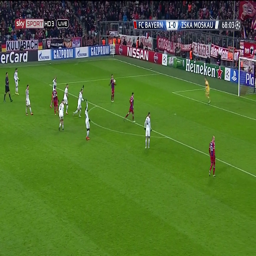

In [24]:
from google.colab.patches import cv2_imshow
results = model.predict(source="/kaggle/working/football-dataset/dataset/train/images/10002.png", conf=0.5)
result = results[0]
cv2_imshow(result.orig_img)

In [25]:
import random

random.seed(15)
box_colors = []
labels = ['Player', 'GK', 'Ball', 'Main Ref', 'Side Ref', 'Staff']
for label in labels:
  box_colors.append(tuple(random.randint(0, 255) for _ in range(3)))

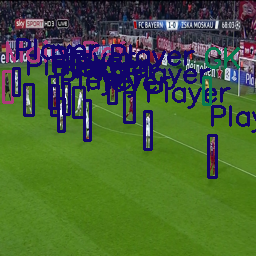

In [26]:
import cv2
from google.colab.patches import cv2_imshow

img = result.orig_img.copy()

for box in result.boxes:
  label = int(box.cls.cpu().numpy()[0])
  x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

  # Draw the bounding box and label
  cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
  cv2.putText(img, labels[label], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)

cv2_imshow(img);

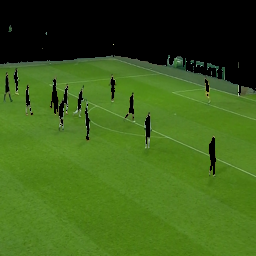

Grass BGR color:  (34.19054363674235, 127.43261820454072, 82.09745886273693)


In [27]:
import numpy as np

# Convert image to HSV color space
img = result.orig_img.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define a large range of green color in HSV
lower_green = np.array([30, 40, 40])
upper_green = np.array([80, 255, 255])

# Threshold the HSV image to get only green colors
mask = cv2.inRange(hsv, lower_green, upper_green)

# Calculate the mean value of the pixels that are not masked
masked_img = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(masked_img)
grass_color = cv2.mean(img, mask=mask)
grass_color = grass_color[:3]
print("Grass BGR color: ", grass_color)

Player Kit Color: 


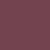

####################################################################################################


Player Kit Color: 


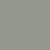

####################################################################################################


Player Kit Color: 


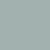

####################################################################################################


Player Kit Color: 


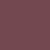

####################################################################################################


Player Kit Color: 


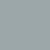

####################################################################################################


Player Kit Color: 


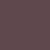

####################################################################################################


Player Kit Color: 


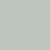

####################################################################################################


Player Kit Color: 


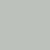

####################################################################################################


Player Kit Color: 


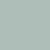

####################################################################################################


Player Kit Color: 


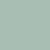

####################################################################################################


Player Kit Color: 


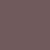

####################################################################################################


Player Kit Color: 


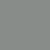

####################################################################################################


In [28]:
kits_colors = []
grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

for box in result.boxes:
  label = int(box.cls.cpu().numpy()[0])
  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
    player_img = result.orig_img[y1: y2, x1: x2]
    cv2_imshow(player_img)
    # Convert image to HSV color space
    hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
    upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Bitwise-AND mask and original image
    mask = cv2.bitwise_not(mask)

    upper_mask = np.zeros(player_img.shape[:2], np.uint8)
    upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
    mask = cv2.bitwise_and(mask, upper_mask)

    masked_img = cv2.bitwise_and(player_img, player_img, mask=mask)
    cv2_imshow(masked_img)

    player_kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])
    kits_colors.append(player_kit_color)

    print("Player Kit Color: ")
    demo_color = np.repeat(player_kit_color[np.newaxis, ...], 50, axis=0)
    demo_color = np.repeat(demo_color[np.newaxis, ...], 50, axis=0)
    cv2_imshow(demo_color)
    print('#' * 100)

In [29]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

kits_kmeans = KMeans(n_clusters=2)
kits_kmeans.fit(kits_colors);

In [30]:
kits_colors = np.array(kits_colors)

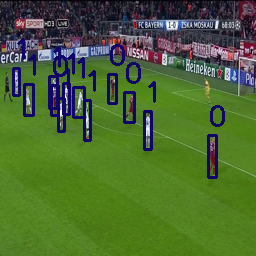

In [31]:
import cv2
from google.colab.patches import cv2_imshow

result = results[0]
img = result.orig_img.copy()
i = 0
for box in result.boxes:
  label = int(box.cls.cpu().numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    team = kits_kmeans.labels_[i]
    cv2.putText(img, str(team), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)
    i += 1

cv2_imshow(img);

Team Left is Team 1


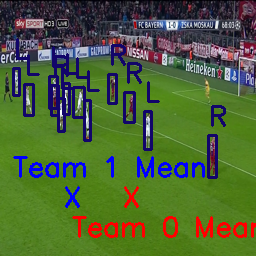

In [32]:
img = result.orig_img.copy()

team_0 = []
team_1 = []

i = 0
team_left = 0
for box in result.boxes:
  label = int(box.cls.cpu().numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

    # Draw the bounding box and label
    team = kits_kmeans.labels_[i]
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))
    i += 1

if (np.mean(team_1) < np.mean(team_0)):
  team_left = 1

i = 0
for box in result.boxes:
  label = int(box.cls.cpu().numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
    team = kits_kmeans.labels_[i]
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    cv2.putText(img, "L" if team==team_left else "R", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9,
                box_colors[int(label)], 2)
    i += 1

cv2.putText(img, "X", (np.mean(team_0).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "Team 0 Mean", (np.mean(team_0).astype(int) - 50, img.shape[0] - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "X", (np.mean(team_1).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
cv2.putText(img, "Team 1 Mean", (np.mean(team_1).astype(int) - 50, img.shape[0] - 80), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

print("Team Left is Team", team_left)
cv2_imshow(img);

In [33]:
import shutil

# Đường dẫn tới thư mục chứa các ảnh huấn luyện và kết quả
results_dir = '/kaggle/working/output/football_detection_results'

# Nén thư mục kết quả thành một tệp ZIP
shutil.make_archive('/kaggle/working/football_detection_results', 'zip', results_dir)

print(f"Đã nén thư mục kết quả tại: /kaggle/working/football_detection_results.zip")

Đã nén thư mục kết quả tại: /kaggle/working/football_detection_results.zip


In [34]:
import cv2
import numpy as np
import sys
import os
from ultralytics import YOLO
from sklearn.cluster import KMeans
import pandas as pd
from collections import defaultdict
from filterpy.kalman import KalmanFilter
from modules.speed_calculator import SpeedCalculator
from modules.field_detector import FieldDetector

ModuleNotFoundError: No module named 'filterpy'

In [ ]:
!gdown 1BbogwoyOKHZjpwBhS78aAzYfS_bJpnLJ
!gdown 1lku9sIvWGdD36_nvTMBf-fiSJsfHHV17
!gdown 1YoV0hF8LffiYZRqzn-wg6VOtzDbl0Piu

In [ ]:
def get_grass_color(img):
    """
    Finds the color of the grass in the background of the image

    Args:
        img: np.array object of shape (WxHx3) that represents the BGR value of the
        frame pixels .

    Returns:
        grass_color
            Tuple of the BGR value of the grass color in the image
    """
    # Convert image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([80, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Calculate the mean value of the pixels that are not masked
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    grass_color = cv2.mean(img, mask=mask)
    return grass_color[:3]


In [ ]:
def get_players_boxes(result):
    """
    Finds the images of the players in the frame and their bounding boxes.

    Args:
        result: ultralytics.engine.results.Results object that contains all the
        result of running the object detection algroithm on the frame

    Returns:
        players_imgs
            List of np.array objects that contain the BGR values of the cropped
            parts of the image that contains players.
        players_boxes
            List of ultralytics.engine.results.Boxes objects that contain various
            information about the bounding boxes of the players found in the image.
    """
    players_imgs = []
    players_boxes = []
    for box in result.boxes:
        label = int(box.cls.cpu().numpy()[0])
        if label == 0:
            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
            player_img = result.orig_img[y1: y2, x1: x2]
            players_imgs.append(player_img)
            players_boxes.append(box)
    return players_imgs, players_boxes

In [ ]:
def get_kits_colors(players, grass_hsv=None, frame=None):
    """
    Finds the kit colors of all the players in the current frame

    Args:
        players: List of np.array objects that contain the BGR values of the image
        portions that contain players.
        grass_hsv: tuple that contain the HSV color value of the grass color of
        the image background.

    Returns:
        kits_colors
            List of np arrays that contain the BGR values of the kits color of all
            the players in the current frame
    """
    kits_colors = []
    if grass_hsv is None:
        grass_color = get_grass_color(frame)
        grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

    for player_img in players:
        # Chuyển sang không gian màu HSV để xử lý tốt hơn với ánh sáng
        hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

        # Tạo mask cho màu cỏ với ngưỡng rộng hơn
        lower_green = np.array([grass_hsv[0, 0, 0] - 15, 30, 30])
        upper_green = np.array([grass_hsv[0, 0, 0] + 15, 255, 255])
        grass_mask = cv2.inRange(hsv, lower_green, upper_green)
        
        # Tạo mask cho vùng áo (1/3 trên của người)
        height = player_img.shape[0]
        upper_third_mask = np.zeros(player_img.shape[:2], np.uint8)
        upper_third_mask[0:height//3] = 255
        
        # Kết hợp các mask
        combined_mask = cv2.bitwise_and(cv2.bitwise_not(grass_mask), upper_third_mask)
        
        # Áp dụng Gaussian blur để giảm nhiễu
        blurred = cv2.GaussianBlur(player_img, (5, 5), 0)
        
        # Tính màu trung bình trong vùng mask
        mean_color = cv2.mean(blurred, mask=combined_mask)
        kit_color = np.array(mean_color[:3])
        
        if not np.any(np.isnan(kit_color)):  # Kiểm tra giá trị hợp lệ
            kits_colors.append(kit_color)
            
    return kits_colors

In [ ]:
def get_kits_classifier(kits_colors):
    """
    Creates a K-Means classifier that can classify the kits accroding to their BGR
    values into 2 different clusters each of them represents one of the teams

    Args:
        kits_colors: List of np.array objects that contain the BGR values of
        the colors of the kits of the players found in the current frame.

    Returns:
        kits_kmeans
            sklearn.cluster.KMeans object that can classify the players kits into
            2 teams according to their color..
    """
    kits_kmeans = KMeans(n_clusters=2)
    kits_kmeans.fit(kits_colors);
    return kits_kmeans


In [ ]:
def classify_kits(kits_classifer, kits_colors):
    """
    Classifies the player into one of the two teams according to the player's kit
    color

    Args:
        kits_classifer: sklearn.cluster.KMeans object that can classify the
        players kits into 2 teams according to their color.
        kits_colors: List of np.array objects that contain the BGR values of
        the colors of the kits of the players found in the current frame.

    Returns:
        team
            np.array object containing a single integer that carries the player's
            team number (0 or 1)
    """
    team = kits_classifer.predict(kits_colors)
    return team


In [ ]:
def get_left_team_label(players_boxes, kits_colors, kits_clf, frame_width):
    """
    Finds the label of the team that is on the left of the screen using multiple frames

    Args:
        players_boxes: List of ultralytics.engine.results.Boxes objects that
        contain various information about the bounding boxes of the players found
        in the image.
        kits_colors: List of np.array objects that contain the BGR values of
        the colors of the kits of the players found in the current frame.
        kits_clf: sklearn.cluster.KMeans object that can classify the players kits
        into 2 teams according to their color.
    Returns:
        left_team_label
            Int that holds the number of the team that's on the left of the image
            either (0 or 1)
    """
    left_team_label = 0
    team_0_left = []  # Số cầu thủ team 0 ở nửa trái
    team_1_left = []  # Số cầu thủ team 1 ở nửa trái
    team_0_positions = []
    team_1_positions = []

    # Phân loại vị trí của từng cầu thủ
    for i in range(len(players_boxes)):
        x1, y1, x2, y2 = map(int, players_boxes[i].xyxy[0].cpu().numpy())
        center_x = (x1 + x2) / 2
        
        team = classify_kits(kits_clf, [kits_colors[i]]).item()
        
        if team == 0:
            team_0_positions.append(center_x)
            if center_x < frame_width / 2:
                team_0_left.append(1)
        else:
            team_1_positions.append(center_x)
            if center_x < frame_width / 2:
                team_1_left.append(1)

    # Tính tỉ lệ cầu thủ ở bên trái của mỗi đội
    team_0_left_ratio = len(team_0_left) / len(team_0_positions) if team_0_positions else 0
    team_1_left_ratio = len(team_1_left) / len(team_1_positions) if team_1_positions else 0

    # Nếu một đội có hơn 60% số cầu thủ ở bên trái, đó là đội bên trái
    if team_0_left_ratio > 0.6:
        left_team_label = 0
    elif team_1_left_ratio > 0.6:
        left_team_label = 1
    else:
        # Nếu không rõ ràng, sử dụng vị trí trung bình
        team_0_avg = np.mean(team_0_positions) if team_0_positions else 0
        team_1_avg = np.mean(team_1_positions) if team_1_positions else 0
        left_team_label = 1 if team_0_avg > team_1_avg else 0

    return left_team_label

In [ ]:
labels = ["Player-L", "Player-R", "GK-L", "GK-R", "Ball", "Main Ref", "Side Ref", "Staff"]
box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from sklearn.cluster import KMeans
from filterpy.kalman import KalmanFilter  # Đảm bảo bạn đã cài filterpy

model = YOLO("/kaggle/working/output/football_detection_results/train/weights/best.pt")

cap = cv2.VideoCapture("/kaggle/working/CityUtdR.mp4")

height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

fourcc = cv2.VideoWriter_fourcc(*'MP4V')
fps = cap.get(cv2.CAP_PROP_FPS)  # Lấy FPS từ video gốc
output_video = cv2.VideoWriter('/kaggle/working/output/CityUtdR_output.mp4', fourcc, fps, (width, height))

kits_clf = None
left_team_label = 0
grass_hsv = None

cap = cv2.VideoCapture('/kaggle/working/CityUtdR.mp4')  # Mở tệp video
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))


while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    current_frame_idx = cap.get(cv2.CAP_PROP_POS_FRAMES)
    if success:

        # Run YOLOv8 inference on the frame
        annotated_frame = cv2.resize(frame, (width, height))
        result = model(annotated_frame, conf=0.5, verbose=False)[0]

        # Get the players boxes and kit colors
        players_imgs, players_boxes = get_players_boxes(result)
        kits_colors = get_kits_colors(players_imgs, grass_hsv, annotated_frame)

        # Run on the first frame only
        if current_frame_idx == 1:
            kits_clf = get_kits_classifier(kits_colors)
            left_team_label = get_left_team_label(players_boxes, kits_colors, kits_clf, frame_width)
            grass_color = get_grass_color(result.orig_img)
            grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

        for box in result.boxes:
            label = int(box.cls.cpu().numpy()[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

            # If the box contains a player, find to which team he belongs
            if label == 0:
                kit_color = get_kits_colors([result.orig_img[y1: y2, x1: x2]], grass_hsv)
                team = classify_kits(kits_clf, kit_color)
                if team == left_team_label:
                    label = 0
                else:
                    label = 1

            # If the box contains a Goalkeeper, find to which team he belongs
            elif label == 1:
                if x1 < 0.5 * width:
                    label = 2
                else:
                    gk_label = 3

            # Increase the label by 2 because of the two add labels "Player-L", "GK-L"
            else:
                label = label + 2

            cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), box_colors[str(label)], 2)
            cv2.putText(annotated_frame, labels[label], (x1 - 30, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

        # Write the annotated frame
        output_video.write(annotated_frame)
    else:
        # Break the loop if the end of the video is reached
        break

cv2.destroyAllWindows()
output_video.release()
cap.release()